<a href="https://colab.research.google.com/github/Manish210103/FaceForge/blob/main/DL_Package.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**INSTALLATION**

In [ ]:
!pip uninstall -y pillow
!pip install --upgrade pillow


Found existing installation: pillow 10.2.0
Uninstalling pillow-10.2.0:
  Successfully uninstalled pillow-10.2.0
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 42.4 MB/s eta 0:00:0000:0100:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
facenet-pytorch 2.6.0 requires Pillow<10.3.0,>=10.2.0, but you have pillow 11.2.1 which is incompatible.
dopamine-rl 4.1.2 requires gymnasium>=1.0.0, but you have gymnasium 0.29.0 which is incompatible.
bigframes 1.36.0 requires rich<14,>=12.4.4, but you have rich 14.0.0 which is incompatible.
plotnine 0.14.5 requires matplotlib>=3.8.0, but you have matplotlib 3.7.5 which is incompatible.
mlxtend 0.23.4 requires scikit-learn>=1.3.1, but you have scikit-learn 1.2.2 which is incompatible.


In [ ]:
!pip install -q opencv-python lpips facenet-pytorch ninja
!git clone -q https://github.com/NVlabs/stylegan2-ada-pytorch.git


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 31.1 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 97.2 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.6/755.6 MB 2.2 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 4.1 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 21.8 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 71.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 47.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 1.5 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 6.2 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 31.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

**IMPORTING LIBRARIES**

In [ ]:
import os
import cv2
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from tqdm.notebook import tqdm

import sys
sys.path.append("./stylegan2-ada-pytorch")
import dnnlib
import legacy

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)


Using device: cuda


**Dataset Preparation**

In [ ]:
DATA_DIR = "/kaggle/input/celebahq-resized-256x256/celeba_hq_256"
assert os.path.exists(DATA_DIR), "Dataset directory not found. Please attach the CelebA-HQ 256 dataset."
image_paths = []
for ext in ('.png', '.jpg', '.jpeg'):
    image_paths += [os.path.join(DATA_DIR, f) for f in os.listdir(DATA_DIR) if f.lower().endswith(ext)]
image_paths = sorted(image_paths)
print(f"Found {len(image_paths)} images.")

num_images = len(image_paths)
split_idx = int(0.9 * num_images)
train_paths = image_paths[:split_idx]
test_paths  = image_paths[split_idx:] if split_idx < num_images else image_paths[-100:]
print(f"Training images: {len(train_paths)}, Test images: {len(test_paths)}")


Found 30000 images.
Training images: 27000, Test images: 3000


**IMAGE TRANSFORMATION**

---
This code defines a custom PyTorch Dataset class called SketchFaceDataset that generates edge-based sketch images using Canny edge detection from facial images and prepares both sketches and original faces as paired tensors. It applies specified transformations and loads them into train/test data loaders for use in tasks like sketch-to-image translation.

In [ ]:
class SketchFaceDataset(Dataset):
    def __init__(self, img_paths, sketch_transform=None, face_transform=None):
        self.img_paths = img_paths
        self.sketch_transform = sketch_transform
        self.face_transform = face_transform
    def __len__(self):
        return len(self.img_paths)
    def __getitem__(self, idx):
        img_path = self.img_paths[idx]
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        sketch_img = cv2.Canny(img, threshold1=100, threshold2=200)
        sketch_img_rgb = cv2.cvtColor(sketch_img, cv2.COLOR_GRAY2RGB)
        if self.sketch_transform:
            sketch_tensor = self.sketch_transform(Image.fromarray(sketch_img_rgb))
        else:
            sketch_tensor = transforms.ToTensor()(sketch_img_rgb) * 2.0 - 1.0
        if self.face_transform:
            face_tensor = self.face_transform(Image.fromarray(img))
        else:
            face_tensor = transforms.ToTensor()(img) * 2.0 - 1.0
        return sketch_tensor, face_tensor

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.5,0.5,0.5], [0.5,0.5,0.5])
])
sketch_transform = transform
face_transform = transform

train_dataset = SketchFaceDataset(train_paths, sketch_transform, face_transform)
test_dataset  = SketchFaceDataset(test_paths, sketch_transform, face_transform)

batch_size = 8
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
test_loader  = DataLoader(test_dataset, batch_size=1, shuffle=False)


**Loading Pretrained StyleGAN2**


---

This code loads a pretrained StyleGAN2 generator (G_ema) from a .pkl file using dnnlib and torch. It ensures the model is correctly loaded, set to evaluation mode, and frozen for inference. It also determines the number of style inputs (num_ws) used by the synthesis network—essential for controlling style-based generation.


In [ ]:
pretrained_model_path = "/kaggle/input/stylegan2-celebahq-256x256-pkl/stylegan2-celebahq-256x256.pkl"

assert os.path.exists(pretrained_model_path), "Pretrained model file not found! Please upload properly."

with dnnlib.util.open_url(pretrained_model_path) as f:
    G = legacy.load_network_pkl(f)['G_ema'].to(device)
G.eval()
print("StyleGAN2 model loaded successfully!")

for param in G.parameters():
    param.requires_grad = False

if hasattr(G.synthesis, 'num_ws'):
    num_styles = G.synthesis.num_ws
else:
    num_styles = G.synthesis.num_layers if hasattr(G.synthesis, 'num_layers') else None
print("Loaded StyleGAN2 generator; number of style inputs:", num_styles)


StyleGAN2 model loaded successfully!
Loaded StyleGAN2 generator; number of style inputs: 14


**OME Encoder Network for Style Modulation**


---

This code defines an OME_Encoder, a neural network that encodes a sketch and previous image into style deltas for modulating a StyleGAN2 generator. Based on a modified ResNet-18, it takes a 6-channel input (concatenated sketch and image), processes multi-level features (coarse, medium, fine), and outputs a latent style representation (delta_w) across multiple style blocks, suitable for tasks like conditional image generation or face editing.


In [ ]:
import torchvision.models as models

class OME_Encoder(nn.Module):
    def __init__(self, num_styles=14, style_dim=512):
        super(OME_Encoder, self).__init__()
        self.num_styles = num_styles
        self.style_dim = style_dim
        resnet = models.resnet18(weights=False)
        self.conv1 = nn.Conv2d(6, 64, kernel_size=7, stride=2, padding=3, bias=False)
        with torch.no_grad():
            self.conv1.weight[:, :] = resnet.conv1.weight.repeat(1, 2, 1, 1) / 2.0
        self.bn1 = resnet.bn1
        self.relu = resnet.relu
        self.maxpool = resnet.maxpool
        self.layer1 = resnet.layer1
        self.layer2 = resnet.layer2
        self.layer3 = resnet.layer3
        self.layer4 = resnet.layer4
        self.fc_coarse = nn.Linear(512, 4 * style_dim)
        self.fc_medium = nn.Linear(256, 4 * style_dim)
        self.fc_fine   = nn.Linear(128, 6 * style_dim)

    def forward(self, sketch_img, prev_img):
        x = torch.cat([sketch_img, prev_img], dim=1)
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        x1 = self.layer1(x)
        x2 = self.layer2(x1)
        x3 = self.layer3(x2)
        x4 = self.layer4(x3)
        feat_coarse = F.adaptive_avg_pool2d(x4, (1,1)).view(x4.size(0), -1)
        feat_medium = F.adaptive_avg_pool2d(x3, (1,1)).view(x3.size(0), -1)
        feat_fine   = F.adaptive_avg_pool2d(x2, (1,1)).view(x2.size(0), -1)
        delta_coarse = self.fc_coarse(feat_coarse).view(-1, 4, self.style_dim)
        delta_medium = self.fc_medium(feat_medium).view(-1, 4, self.style_dim)
        delta_fine   = self.fc_fine(feat_fine).view(-1, 6, self.style_dim)
        delta_w = torch.cat([delta_coarse, delta_medium, delta_fine], dim=1)
        return delta_w

encoder = OME_Encoder(num_styles=num_styles if num_styles else 14, style_dim=512).to(device)


**Loss Functions**


---

This code sets up three key loss functions for guiding image generation quality:


* L2 Loss (MSE): Measures pixel-wise differences between generated and target images.
* LPIPS Loss: A perceptual loss based on deep feature similarity using a VGG network, better capturing human visual perception.
* Identity Loss: Uses a pretrained InceptionResnetV1 from facenet_pytorch to compare identity embeddings of generated and real images, ensuring identity preservation in face generation tasks.





In [ ]:
criterion_l2 = nn.MSELoss()

import lpips
lpips_loss_fn = lpips.LPIPS(net='vgg').to(device)

id_model = None
id_loss_fn = None
try:
    from facenet_pytorch import InceptionResnetV1
    id_model = InceptionResnetV1(pretrained='vggface2').eval().to(device)
    def identity_loss(gen_img, real_img):
        gen_img_norm = (gen_img * 0.5 + 0.5)
        real_img_norm = (real_img * 0.5 + 0.5)
        gen_img_resized = F.interpolate(gen_img_norm, size=(160,160), mode='bilinear')
        real_img_resized = F.interpolate(real_img_norm, size=(160,160), mode='bilinear')
        with torch.no_grad():
            emb_gen  = id_model(gen_img_resized)
            emb_real = id_model(real_img_resized)
        emb_gen = F.normalize(emb_gen, p=2, dim=1)
        emb_real = F.normalize(emb_real, p=2, dim=1)
        cos_sim = (emb_gen * emb_real).sum(dim=1)
        return (1 - cos_sim).mean()
    id_loss_fn = identity_loss
    print("Identity model loaded for identity loss.")
except Exception as e:
    print("Identity model not available, proceeding without identity loss.", e)


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:03<00:00, 179MB/s]  


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth


  0%|          | 0.00/107M [00:00<?, ?B/s]

Identity model loaded for identity loss.


**Encoder Training with StyleGAN2**


---
This code trains the OME_Encoder to generate style deltas (delta_w) for modulating the pretrained StyleGAN2 generator to synthesize face images from sketches. Using a frozen average latent vector w_avg as a base, the encoder adjusts styles to better match target images. The loss combines:

* L2 loss (pixel-wise)

* LPIPS loss (perceptual similarity)

* Identity loss (facial identity preservation)

All weighted to guide the encoder in generating realistic and identity-consistent images. The model is trained using the Adam optimizer over multiple epochs with real-time loss monitoring.


In [ ]:
optimizer = torch.optim.Adam(encoder.parameters(), lr=1e-4, betas=(0.9, 0.999))

if hasattr(G, 'mapping'):
    w_avg = G.mapping.w_avg.unsqueeze(0)
    w_avg = w_avg.repeat(1, num_styles, 1).to(device)
else:
    z = torch.randn(1024, G.z_dim).to(device)
    w_avg = G.mapping(z, None).mean(dim=0, keepdim=True)
    w_avg = w_avg.repeat(1, num_styles, 1).to(device)

with torch.no_grad():
    avg_face_img = G.synthesis(w_avg, noise_mode='const')[0]
    avg_face_img = avg_face_img.unsqueeze(0)

epochs = 10
lambda_lpips = 0.8
lambda_id = 0.1
for epoch in range(epochs):
    encoder.train()
    running_loss = 0.0
    for i, (sketch_batch, real_batch) in enumerate(tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}")):
        sketch_batch = sketch_batch.to(device)
        real_batch = real_batch.to(device)
        batch_size_curr = sketch_batch.size(0)
        w_prev = w_avg.repeat(batch_size_curr, 1, 1)
        prev_img = avg_face_img.repeat(batch_size_curr, 1, 1, 1).to(device)
        delta_w = encoder(sketch_batch, prev_img)
        w_pred = w_prev + delta_w
        gen_imgs = G.synthesis(w_pred, noise_mode='const')
        loss_l2 = criterion_l2(gen_imgs, real_batch)
        loss_lpips = lpips_loss_fn(gen_imgs, real_batch).mean()
        loss_id = torch.tensor(0.0, device=device)
        if id_loss_fn:
            loss_id = id_loss_fn(gen_imgs, real_batch)
        loss = loss_l2 + lambda_lpips * loss_lpips + (lambda_id * loss_id if id_loss_fn else 0)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        if (i+1) % 100 == 0:
            avg_loss = running_loss / (i+1)
            print(f"Batch {i+1}/{len(train_loader)} - Loss: {avg_loss:.4f} (L2={loss_l2.item():.3f}, LPIPS={loss_lpips.item():.3f}, ID={loss_id.item() if id_loss_fn else 0:.3f})")
    avg_epoch_loss = running_loss / len(train_loader)
    print(f"Epoch {epoch+1} completed. Average Loss: {avg_epoch_loss:.4f}")


Epoch 1/10:   0%|          | 0/3375 [00:00<?, ?it/s]

Batch 100/3375 - Loss: 0.7677 (L2=0.225, LPIPS=0.479, ID=0.906)
Batch 200/3375 - Loss: 0.7625 (L2=0.232, LPIPS=0.517, ID=0.878)
Batch 300/3375 - Loss: 0.7566 (L2=0.196, LPIPS=0.523, ID=0.949)
Batch 400/3375 - Loss: 0.7553 (L2=0.221, LPIPS=0.507, ID=1.005)
Batch 500/3375 - Loss: 0.7503 (L2=0.233, LPIPS=0.479, ID=0.856)
Batch 600/3375 - Loss: 0.7465 (L2=0.295, LPIPS=0.504, ID=0.811)
Batch 700/3375 - Loss: 0.7436 (L2=0.193, LPIPS=0.464, ID=0.868)
Batch 800/3375 - Loss: 0.7406 (L2=0.249, LPIPS=0.489, ID=0.904)
Batch 900/3375 - Loss: 0.7375 (L2=0.225, LPIPS=0.494, ID=0.917)
Batch 1000/3375 - Loss: 0.7351 (L2=0.231, LPIPS=0.512, ID=0.803)
Batch 1100/3375 - Loss: 0.7326 (L2=0.174, LPIPS=0.458, ID=0.849)
Batch 1200/3375 - Loss: 0.7308 (L2=0.331, LPIPS=0.495, ID=0.984)
Batch 1300/3375 - Loss: 0.7285 (L2=0.156, LPIPS=0.463, ID=0.885)
Batch 1400/3375 - Loss: 0.7267 (L2=0.274, LPIPS=0.469, ID=0.751)
Batch 1500/3375 - Loss: 0.7252 (L2=0.212, LPIPS=0.474, ID=0.750)
Batch 1600/3375 - Loss: 0.7232 (L2

Epoch 2/10:   0%|          | 0/3375 [00:00<?, ?it/s]

Batch 100/3375 - Loss: 0.6778 (L2=0.274, LPIPS=0.475, ID=0.868)
Batch 200/3375 - Loss: 0.6763 (L2=0.310, LPIPS=0.488, ID=0.811)
Batch 300/3375 - Loss: 0.6728 (L2=0.197, LPIPS=0.459, ID=0.831)
Batch 400/3375 - Loss: 0.6691 (L2=0.274, LPIPS=0.493, ID=0.838)
Batch 500/3375 - Loss: 0.6634 (L2=0.148, LPIPS=0.449, ID=0.740)
Batch 600/3375 - Loss: 0.6626 (L2=0.200, LPIPS=0.452, ID=0.892)
Batch 700/3375 - Loss: 0.6632 (L2=0.229, LPIPS=0.482, ID=0.762)
Batch 800/3375 - Loss: 0.6615 (L2=0.200, LPIPS=0.456, ID=0.881)
Batch 900/3375 - Loss: 0.6607 (L2=0.158, LPIPS=0.449, ID=0.737)
Batch 1000/3375 - Loss: 0.6600 (L2=0.151, LPIPS=0.440, ID=0.704)
Batch 1100/3375 - Loss: 0.6585 (L2=0.172, LPIPS=0.406, ID=0.739)
Batch 1200/3375 - Loss: 0.6589 (L2=0.253, LPIPS=0.459, ID=0.771)
Batch 1300/3375 - Loss: 0.6581 (L2=0.122, LPIPS=0.449, ID=0.781)
Batch 1400/3375 - Loss: 0.6572 (L2=0.216, LPIPS=0.492, ID=0.772)
Batch 1500/3375 - Loss: 0.6566 (L2=0.168, LPIPS=0.452, ID=0.741)
Batch 1600/3375 - Loss: 0.6559 (L2

Epoch 3/10:   0%|          | 0/3375 [00:00<?, ?it/s]

Batch 100/3375 - Loss: 0.6292 (L2=0.145, LPIPS=0.416, ID=0.804)
Batch 200/3375 - Loss: 0.6284 (L2=0.195, LPIPS=0.436, ID=0.713)
Batch 300/3375 - Loss: 0.6248 (L2=0.152, LPIPS=0.432, ID=0.703)
Batch 400/3375 - Loss: 0.6256 (L2=0.152, LPIPS=0.455, ID=0.826)
Batch 500/3375 - Loss: 0.6277 (L2=0.196, LPIPS=0.445, ID=0.872)
Batch 600/3375 - Loss: 0.6279 (L2=0.189, LPIPS=0.435, ID=0.811)
Batch 700/3375 - Loss: 0.6278 (L2=0.237, LPIPS=0.440, ID=0.756)
Batch 800/3375 - Loss: 0.6282 (L2=0.131, LPIPS=0.424, ID=0.710)
Batch 900/3375 - Loss: 0.6289 (L2=0.214, LPIPS=0.471, ID=0.675)
Batch 1000/3375 - Loss: 0.6291 (L2=0.189, LPIPS=0.449, ID=0.831)
Batch 1100/3375 - Loss: 0.6289 (L2=0.232, LPIPS=0.463, ID=0.765)
Batch 1200/3375 - Loss: 0.6290 (L2=0.212, LPIPS=0.503, ID=0.852)
Batch 1300/3375 - Loss: 0.6287 (L2=0.302, LPIPS=0.462, ID=0.782)
Batch 1400/3375 - Loss: 0.6289 (L2=0.212, LPIPS=0.415, ID=0.854)
Batch 1500/3375 - Loss: 0.6284 (L2=0.161, LPIPS=0.458, ID=0.886)
Batch 1600/3375 - Loss: 0.6280 (L2

Epoch 4/10:   0%|          | 0/3375 [00:00<?, ?it/s]

Batch 100/3375 - Loss: 0.6172 (L2=0.244, LPIPS=0.456, ID=0.694)
Batch 200/3375 - Loss: 0.6140 (L2=0.284, LPIPS=0.491, ID=0.768)
Batch 300/3375 - Loss: 0.6116 (L2=0.126, LPIPS=0.427, ID=0.768)
Batch 400/3375 - Loss: 0.6131 (L2=0.155, LPIPS=0.443, ID=0.724)
Batch 500/3375 - Loss: 0.6139 (L2=0.219, LPIPS=0.447, ID=0.756)
Batch 600/3375 - Loss: 0.6135 (L2=0.204, LPIPS=0.451, ID=0.730)
Batch 700/3375 - Loss: 0.6131 (L2=0.171, LPIPS=0.436, ID=0.756)
Batch 800/3375 - Loss: 0.6132 (L2=0.192, LPIPS=0.431, ID=0.700)
Batch 900/3375 - Loss: 0.6132 (L2=0.143, LPIPS=0.440, ID=0.740)
Batch 1000/3375 - Loss: 0.6128 (L2=0.188, LPIPS=0.461, ID=0.652)
Batch 1100/3375 - Loss: 0.6124 (L2=0.158, LPIPS=0.430, ID=0.714)
Batch 1200/3375 - Loss: 0.6123 (L2=0.216, LPIPS=0.457, ID=0.784)
Batch 1300/3375 - Loss: 0.6112 (L2=0.180, LPIPS=0.454, ID=0.752)
Batch 1400/3375 - Loss: 0.6109 (L2=0.276, LPIPS=0.440, ID=0.683)
Batch 1500/3375 - Loss: 0.6104 (L2=0.157, LPIPS=0.485, ID=0.746)
Batch 1600/3375 - Loss: 0.6106 (L2

Epoch 5/10:   0%|          | 0/3375 [00:00<?, ?it/s]

Batch 100/3375 - Loss: 0.6038 (L2=0.139, LPIPS=0.403, ID=0.695)
Batch 200/3375 - Loss: 0.5979 (L2=0.157, LPIPS=0.436, ID=0.815)
Batch 300/3375 - Loss: 0.5997 (L2=0.181, LPIPS=0.426, ID=0.659)
Batch 400/3375 - Loss: 0.5979 (L2=0.193, LPIPS=0.468, ID=0.801)
Batch 500/3375 - Loss: 0.5990 (L2=0.177, LPIPS=0.461, ID=0.720)
Batch 600/3375 - Loss: 0.5981 (L2=0.129, LPIPS=0.432, ID=0.672)
Batch 700/3375 - Loss: 0.5984 (L2=0.160, LPIPS=0.445, ID=0.813)
Batch 800/3375 - Loss: 0.5979 (L2=0.292, LPIPS=0.437, ID=0.731)
Batch 900/3375 - Loss: 0.5979 (L2=0.168, LPIPS=0.443, ID=0.751)
Batch 1000/3375 - Loss: 0.5967 (L2=0.123, LPIPS=0.447, ID=0.711)
Batch 1100/3375 - Loss: 0.5974 (L2=0.217, LPIPS=0.457, ID=0.800)
Batch 1200/3375 - Loss: 0.5970 (L2=0.189, LPIPS=0.448, ID=0.720)
Batch 1300/3375 - Loss: 0.5971 (L2=0.167, LPIPS=0.454, ID=0.656)
Batch 1400/3375 - Loss: 0.5974 (L2=0.155, LPIPS=0.411, ID=0.692)
Batch 1500/3375 - Loss: 0.5978 (L2=0.183, LPIPS=0.461, ID=0.809)
Batch 1600/3375 - Loss: 0.5979 (L2

Epoch 6/10:   0%|          | 0/3375 [00:00<?, ?it/s]

Batch 100/3375 - Loss: 0.5790 (L2=0.099, LPIPS=0.396, ID=0.795)
Batch 200/3375 - Loss: 0.5795 (L2=0.157, LPIPS=0.402, ID=0.671)
Batch 300/3375 - Loss: 0.5833 (L2=0.160, LPIPS=0.454, ID=0.770)
Batch 400/3375 - Loss: 0.5839 (L2=0.162, LPIPS=0.407, ID=0.705)
Batch 500/3375 - Loss: 0.5851 (L2=0.182, LPIPS=0.421, ID=0.726)
Batch 600/3375 - Loss: 0.5843 (L2=0.208, LPIPS=0.484, ID=0.631)
Batch 700/3375 - Loss: 0.5842 (L2=0.129, LPIPS=0.410, ID=0.682)
Batch 800/3375 - Loss: 0.5857 (L2=0.160, LPIPS=0.404, ID=0.711)
Batch 900/3375 - Loss: 0.5862 (L2=0.199, LPIPS=0.438, ID=0.813)
Batch 1000/3375 - Loss: 0.5868 (L2=0.116, LPIPS=0.423, ID=0.692)
Batch 1100/3375 - Loss: 0.5864 (L2=0.155, LPIPS=0.484, ID=0.764)
Batch 1200/3375 - Loss: 0.5863 (L2=0.217, LPIPS=0.434, ID=0.848)
Batch 1300/3375 - Loss: 0.5861 (L2=0.159, LPIPS=0.439, ID=0.761)
Batch 1400/3375 - Loss: 0.5857 (L2=0.200, LPIPS=0.410, ID=0.741)
Batch 1500/3375 - Loss: 0.5855 (L2=0.151, LPIPS=0.433, ID=0.695)
Batch 1600/3375 - Loss: 0.5856 (L2

Epoch 7/10:   0%|          | 0/3375 [00:00<?, ?it/s]

Batch 100/3375 - Loss: 0.5787 (L2=0.158, LPIPS=0.414, ID=0.739)
Batch 200/3375 - Loss: 0.5779 (L2=0.189, LPIPS=0.444, ID=0.786)
Batch 300/3375 - Loss: 0.5777 (L2=0.177, LPIPS=0.410, ID=0.752)
Batch 400/3375 - Loss: 0.5750 (L2=0.181, LPIPS=0.446, ID=0.582)
Batch 500/3375 - Loss: 0.5733 (L2=0.161, LPIPS=0.455, ID=0.802)
Batch 600/3375 - Loss: 0.5728 (L2=0.140, LPIPS=0.435, ID=0.777)
Batch 700/3375 - Loss: 0.5723 (L2=0.230, LPIPS=0.434, ID=0.790)
Batch 800/3375 - Loss: 0.5724 (L2=0.147, LPIPS=0.417, ID=0.790)
Batch 900/3375 - Loss: 0.5722 (L2=0.130, LPIPS=0.407, ID=0.706)
Batch 1000/3375 - Loss: 0.5718 (L2=0.140, LPIPS=0.428, ID=0.764)
Batch 1100/3375 - Loss: 0.5715 (L2=0.165, LPIPS=0.462, ID=0.759)
Batch 1200/3375 - Loss: 0.5724 (L2=0.158, LPIPS=0.429, ID=0.686)
Batch 1300/3375 - Loss: 0.5723 (L2=0.177, LPIPS=0.465, ID=0.803)
Batch 1400/3375 - Loss: 0.5726 (L2=0.136, LPIPS=0.433, ID=0.615)
Batch 1500/3375 - Loss: 0.5723 (L2=0.114, LPIPS=0.399, ID=0.654)
Batch 1600/3375 - Loss: 0.5720 (L2

Epoch 8/10:   0%|          | 0/3375 [00:00<?, ?it/s]

Batch 100/3375 - Loss: 0.5644 (L2=0.128, LPIPS=0.404, ID=0.646)
Batch 200/3375 - Loss: 0.5630 (L2=0.151, LPIPS=0.460, ID=0.718)
Batch 300/3375 - Loss: 0.5619 (L2=0.100, LPIPS=0.421, ID=0.798)
Batch 400/3375 - Loss: 0.5623 (L2=0.152, LPIPS=0.472, ID=0.798)
Batch 500/3375 - Loss: 0.5622 (L2=0.121, LPIPS=0.397, ID=0.739)
Batch 600/3375 - Loss: 0.5617 (L2=0.148, LPIPS=0.458, ID=0.698)
Batch 700/3375 - Loss: 0.5611 (L2=0.189, LPIPS=0.491, ID=0.688)
Batch 800/3375 - Loss: 0.5603 (L2=0.129, LPIPS=0.415, ID=0.591)
Batch 900/3375 - Loss: 0.5601 (L2=0.116, LPIPS=0.435, ID=0.666)
Batch 1000/3375 - Loss: 0.5605 (L2=0.164, LPIPS=0.427, ID=0.773)
Batch 1100/3375 - Loss: 0.5608 (L2=0.159, LPIPS=0.483, ID=0.794)
Batch 1200/3375 - Loss: 0.5618 (L2=0.145, LPIPS=0.408, ID=0.647)
Batch 1300/3375 - Loss: 0.5617 (L2=0.117, LPIPS=0.415, ID=0.674)
Batch 1400/3375 - Loss: 0.5614 (L2=0.177, LPIPS=0.421, ID=0.674)
Batch 1500/3375 - Loss: 0.5615 (L2=0.138, LPIPS=0.437, ID=0.724)
Batch 1600/3375 - Loss: 0.5616 (L2

Epoch 9/10:   0%|          | 0/3375 [00:00<?, ?it/s]

Batch 100/3375 - Loss: 0.5530 (L2=0.100, LPIPS=0.404, ID=0.660)
Batch 200/3375 - Loss: 0.5505 (L2=0.117, LPIPS=0.402, ID=0.629)
Batch 300/3375 - Loss: 0.5500 (L2=0.148, LPIPS=0.436, ID=0.730)
Batch 400/3375 - Loss: 0.5495 (L2=0.134, LPIPS=0.428, ID=0.683)
Batch 500/3375 - Loss: 0.5496 (L2=0.139, LPIPS=0.436, ID=0.818)
Batch 600/3375 - Loss: 0.5505 (L2=0.160, LPIPS=0.458, ID=0.649)
Batch 700/3375 - Loss: 0.5508 (L2=0.118, LPIPS=0.391, ID=0.739)
Batch 800/3375 - Loss: 0.5511 (L2=0.093, LPIPS=0.382, ID=0.696)
Batch 900/3375 - Loss: 0.5514 (L2=0.143, LPIPS=0.442, ID=0.760)
Batch 1000/3375 - Loss: 0.5517 (L2=0.136, LPIPS=0.422, ID=0.627)
Batch 1100/3375 - Loss: 0.5516 (L2=0.158, LPIPS=0.470, ID=0.761)
Batch 1200/3375 - Loss: 0.5523 (L2=0.138, LPIPS=0.482, ID=0.770)
Batch 1300/3375 - Loss: 0.5521 (L2=0.116, LPIPS=0.382, ID=0.635)
Batch 1400/3375 - Loss: 0.5525 (L2=0.170, LPIPS=0.430, ID=0.717)
Batch 1500/3375 - Loss: 0.5524 (L2=0.172, LPIPS=0.437, ID=0.736)
Batch 1600/3375 - Loss: 0.5523 (L2

Epoch 10/10:   0%|          | 0/3375 [00:00<?, ?it/s]

Batch 100/3375 - Loss: 0.5403 (L2=0.142, LPIPS=0.454, ID=0.880)
Batch 200/3375 - Loss: 0.5436 (L2=0.141, LPIPS=0.443, ID=0.729)
Batch 300/3375 - Loss: 0.5439 (L2=0.184, LPIPS=0.489, ID=0.783)
Batch 400/3375 - Loss: 0.5440 (L2=0.098, LPIPS=0.401, ID=0.637)
Batch 500/3375 - Loss: 0.5443 (L2=0.115, LPIPS=0.405, ID=0.693)
Batch 600/3375 - Loss: 0.5462 (L2=0.150, LPIPS=0.437, ID=0.731)
Batch 700/3375 - Loss: 0.5457 (L2=0.104, LPIPS=0.432, ID=0.697)
Batch 800/3375 - Loss: 0.5462 (L2=0.130, LPIPS=0.437, ID=0.756)
Batch 900/3375 - Loss: 0.5464 (L2=0.197, LPIPS=0.496, ID=0.763)
Batch 1000/3375 - Loss: 0.5455 (L2=0.106, LPIPS=0.393, ID=0.715)
Batch 1100/3375 - Loss: 0.5455 (L2=0.171, LPIPS=0.465, ID=0.751)
Batch 1200/3375 - Loss: 0.5458 (L2=0.175, LPIPS=0.421, ID=0.636)
Batch 1300/3375 - Loss: 0.5455 (L2=0.094, LPIPS=0.401, ID=0.599)
Batch 1400/3375 - Loss: 0.5453 (L2=0.112, LPIPS=0.407, ID=0.701)
Batch 1500/3375 - Loss: 0.5454 (L2=0.136, LPIPS=0.452, ID=0.809)
Batch 1600/3375 - Loss: 0.5451 (L2

**Inference & Visualization**


---
This inference block evaluates the trained OME_Encoder by feeding a sketch image through the encoder and pretrained StyleGAN2 generator to synthesize a face. It visualizes:

* Input Sketch

* Generated Face

* Ground Truth Face

side-by-side using matplotlib. The outputs are normalized and converted to NumPy format for display, helping assess how well the model reconstructs facial features from sketch inputs.


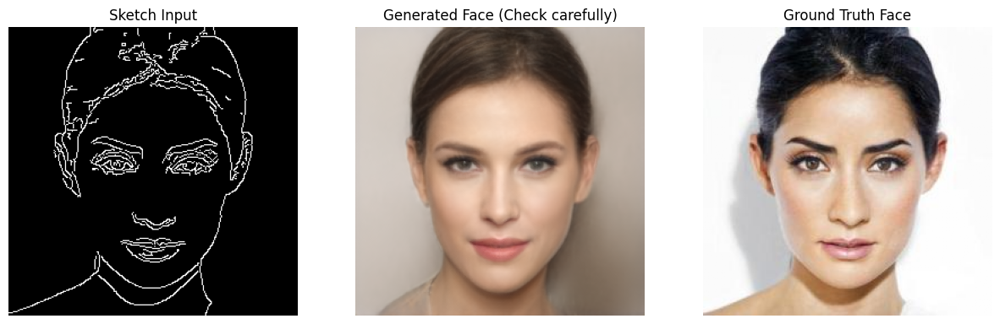

In [ ]:
encoder.eval()
with torch.no_grad():
    sample_sketch, sample_face = next(iter(test_loader))
    sample_sketch = sample_sketch.to(device)

    w_current = w_avg.repeat(1,1,1).to(device)
    prev_img = avg_face_img.to(device)

    delta_w = encoder(sample_sketch, prev_img)
    w_current = w_current + delta_w
    gen_img = G.synthesis(w_current, noise_mode='const')

    gen_img_vis = (gen_img * 0.5 + 0.5).clamp(0,1).cpu().numpy()[0].transpose(1,2,0)
    sketch_vis = (sample_sketch * 0.5 + 0.5).clamp(0,1).cpu().numpy()[0].transpose(1,2,0)
    face_vis = (sample_face * 0.5 + 0.5).clamp(0,1).cpu().numpy()[0].transpose(1,2,0)

    fig, ax = plt.subplots(1,3, figsize=(15,5))
    ax[0].imshow(sketch_vis)
    ax[0].set_title("Sketch Input")
    ax[0].axis("off")

    ax[1].imshow(gen_img_vis)
    ax[1].set_title("Generated Face (Check carefully)")
    ax[1].axis("off")

    ax[2].imshow(face_vis)
    ax[2].set_title("Ground Truth Face")
    ax[2].axis("off")

    plt.show()


**Batch Inference**

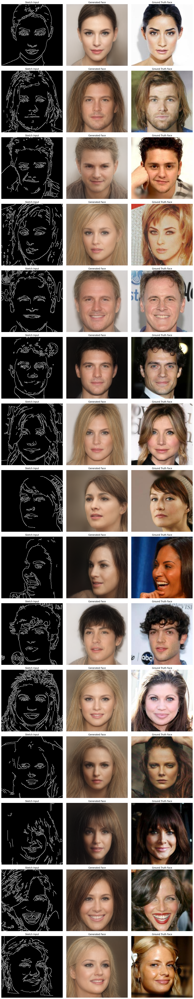

In [ ]:
import matplotlib.pyplot as plt
import cv2

encoder.eval()

def generate_face_minimal(sample_sketch):
    sample_sketch = sample_sketch.unsqueeze(0).to(device)
    w_current = w_avg.repeat(1, 1, 1).to(device)
    prev_img = avg_face_img.to(device)
    with torch.no_grad():
        delta_w = encoder(sample_sketch, prev_img)
        w_current = w_current + delta_w
        gen_img = G.synthesis(w_current, noise_mode='const')
    return gen_img[0]

num_samples_to_show = 15
samples_loader = iter(test_loader)

fig, axes = plt.subplots(num_samples_to_show, 3, figsize=(15, 5 * num_samples_to_show))

for idx in range(num_samples_to_show):
    sample_sketch, sample_face = next(samples_loader)

    output_tensor = generate_face_minimal(sample_sketch[0])

    sketch_vis = (sample_sketch[0] * 0.5 + 0.5).clamp(0,1).cpu().numpy().transpose(1,2,0)
    output_img = (output_tensor * 0.5 + 0.5).clamp(0,1).detach().cpu().numpy().transpose(1,2,0)
    face_vis = (sample_face[0] * 0.5 + 0.5).clamp(0,1).cpu().numpy().transpose(1,2,0)

    axes[idx, 0].imshow(sketch_vis)
    axes[idx, 0].set_title("Sketch Input")
    axes[idx, 0].axis("off")

    axes[idx, 1].imshow(output_img)
    axes[idx, 1].set_title("Generated Face")
    axes[idx, 1].axis("off")

    axes[idx, 2].imshow(face_vis)
    axes[idx, 2].set_title("Ground Truth Face")
    axes[idx, 2].axis("off")

plt.tight_layout()
plt.show()
